In [56]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression 

In [134]:
import os
os.getcwd()

'c:\\kaggle'

In [ ]:
from pathlib import Path

PROJECT_ROOT = Path.cwd() 
# load the datasets
team_stats = pd.read_csv(PROJECT_ROOT / 'NBA' / 'Stats' / 'TeamStatistics.csv')
team_stats_ext = pd.read_csv(PROJECT_ROOT / 'NBA' / 'Stats' / 'TeamStatisticsExtended.csv')

In [59]:
PROJECT_ROOT

WindowsPath('c:/kaggle')

In [136]:
team_stats

,gameId,gameDateTimeEst,teamCity,teamName,teamId,opponentTeamCity,opponentTeamName,opponentTeamId,home,win,...,gameLabel,gameSubLabel,seriesGameNumber,seed,reboundsTeam,turnoversTeam,ot1Points,ot2Points,otAllPoints,gameDate
0,42500404,2026-06-10 20:30:00,San Antonio,Spurs,1610612759,New York,Knicks,1610612752,0,0.0,...,NBA Finals,Game 4,4.0,2.0,8.0,1.0,NaN,NaN,NaN,2026-06-10 20:30:00
1,42500404,2026-06-10 20:30:00,New York,Knicks,1610612752,San Antonio,Spurs,1610612759,1,1.0,...,NBA Finals,Game 4,4.0,3.0,14.0,2.0,NaN,NaN,NaN,2026-06-10 20:30:00
2,42500403,2026-06-08 20:30:00,New York,Knicks,1610612752,San Antonio,Spurs,1610612759,1,0.0,...,NBA Finals,Game 3,3.0,3.0,10.0,0.0,NaN,NaN,NaN,2026-06-08 20:30:00
3,42500403,2026-06-08 20:30:00,San Antonio,Spurs,1610612759,New York,Knicks,1610612752,0,1.0,...,NBA Finals,Game 3,3.0,2.0,11.0,0.0,NaN,NaN,NaN,2026-06-08 20:30:00
4,42500402,2026-06-05 20:30:00,San Antonio,Spurs,1610612759,New York,Knicks,1610612752,1,0.0,...,NBA Finals,Game 2,2.0,2.0,11.0,0.0,NaN,NaN,NaN,2026-06-05 20:30:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146553,24600076,1946-12-05 19:00:00,New York,Knicks,1610612752,Philadelphia,Warriors,1610612744,0,0.0,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,1946-12-05 19:00:00
146554,24600063,1946-11-30 19:00:00,Philadelphia,Warriors,1610612744,New York,Knicks,1610612752,0,0.0,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,1946-11-30 19:00:00
146555,24600063,1946-11-30 19:00:00,New York,Knicks,1610612752,Philadelphia,Warriors,1610612744,1,1.0,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,1946-11-30 19:00:00
146556,24600052,1946-11-26 19:00:00,Boston,Celtics,1610612738,Philadelphia,Warriors,1610612744,0,0.0,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,1946-11-26 19:00:00


In [138]:
team_stats.columns

Index(['gameId', 'gameDateTimeEst', 'teamCity', 'teamName', 'teamId',
       'opponentTeamCity', 'opponentTeamName', 'opponentTeamId', 'home', 'win',
       'teamScore', 'opponentScore', 'assists', 'blocks', 'steals',
       'fieldGoalsAttempted', 'fieldGoalsMade', 'fieldGoalsPercentage',
       'threePointersAttempted', 'threePointersMade',
       'threePointersPercentage', 'freeThrowsAttempted', 'freeThrowsMade',
       'freeThrowsPercentage', 'reboundsDefensive', 'reboundsOffensive',
       'reboundsTotal', 'foulsPersonal', 'turnovers', 'plusMinusPoints',
       'numMinutes', 'q1Points', 'q2Points', 'q3Points', 'q4Points',
       'benchPoints', 'biggestLead', 'biggestScoringRun', 'leadChanges',
       'pointsFastBreak', 'pointsFromTurnovers', 'pointsInThePaint',
       'pointsSecondChance', 'timesTied', 'timeoutsRemaining', 'seasonWins',
       'seasonLosses', 'coachId', 'gameType', 'gameLabel', 'gameSubLabel',
       'seriesGameNumber', 'seed', 'reboundsTeam', 'turnoversTeam',
    

In [143]:
team_stats[['teamScore', 'opponentScore', 'plusMinusPoints', 'gameDate']].head(20)

,teamScore,opponentScore,plusMinusPoints,gameDate
0,106,107,-1.0,2026-06-10 20:30:00
1,107,106,1.0,2026-06-10 20:30:00
2,111,115,-4.0,2026-06-08 20:30:00
3,115,111,4.0,2026-06-08 20:30:00
4,104,105,-1.0,2026-06-05 20:30:00
5,105,104,1.0,2026-06-05 20:30:00
6,105,95,10.0,2026-06-03 20:30:00
7,95,105,-10.0,2026-06-03 20:30:00
8,103,111,-8.0,2026-05-30 20:00:00
9,111,103,8.0,2026-05-30 20:00:00


In [140]:
team_stats['gameDate'].describe()

count                  146558
unique                  34923
top       1995-11-03 20:00:00
freq                       28
Name: gameDate, dtype: object

In [144]:
team_stats['gameDate'] = pd.to_datetime(team_stats['gameDate'], errors='coerce')

In [65]:
# Define a function to map a date to its NBA season "start year"
def get_season_start_year(date):
    if date.month >= 10:  # Oct, Nov, Dec -> season starts this year
        return date.year
    else:  # Jan-June (and any stray summer dates) -> season started previous year
        return date.year - 1

In [145]:
team_stats['season'] = team_stats['gameDate'].apply(get_season_start_year)

In [146]:
team_stats['season']

0         2025
1         2025
2         2025
3         2025
4         2025
          ... 
146553    1946
146554    1946
146555    1946
146556    1946
146557    1946
Name: season, Length: 146558, dtype: int64

In [176]:
start_year = 2010
team_stats_recent = team_stats[team_stats['season'] >= start_year]

In [177]:
team_stats_recent

,gameId,gameDateTimeEst,teamCity,teamName,teamId,opponentTeamCity,opponentTeamName,opponentTeamId,home,win,...,gameSubLabel,seriesGameNumber,seed,reboundsTeam,turnoversTeam,ot1Points,ot2Points,otAllPoints,gameDate,season
0,42500404,2026-06-10 20:30:00,San Antonio,Spurs,1610612759,New York,Knicks,1610612752,0,0.0,...,Game 4,4.0,2.0,8.0,1.0,NaN,NaN,NaN,2026-06-10 20:30:00,2025
1,42500404,2026-06-10 20:30:00,New York,Knicks,1610612752,San Antonio,Spurs,1610612759,1,1.0,...,Game 4,4.0,3.0,14.0,2.0,NaN,NaN,NaN,2026-06-10 20:30:00,2025
2,42500403,2026-06-08 20:30:00,New York,Knicks,1610612752,San Antonio,Spurs,1610612759,1,0.0,...,Game 3,3.0,3.0,10.0,0.0,NaN,NaN,NaN,2026-06-08 20:30:00,2025
3,42500403,2026-06-08 20:30:00,San Antonio,Spurs,1610612759,New York,Knicks,1610612752,0,1.0,...,Game 3,3.0,2.0,11.0,0.0,NaN,NaN,NaN,2026-06-08 20:30:00,2025
4,42500402,2026-06-05 20:30:00,San Antonio,Spurs,1610612759,New York,Knicks,1610612752,1,0.0,...,Game 2,2.0,2.0,11.0,0.0,NaN,NaN,NaN,2026-06-05 20:30:00,2025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43545,11000004,2010-10-05 19:00:00,Charlotte,Bobcats,1610612766,Cleveland,Cavaliers,1610612739,0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2010-10-05 19:00:00,2010
43546,11000007,2010-10-05 19:00:00,New Jersey,Nets,1610612751,Philadelphia,76ers,1610612755,0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2010-10-05 19:00:00,2010
43547,11000007,2010-10-05 19:00:00,Philadelphia,76ers,1610612755,New Jersey,Nets,1610612751,1,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2010-10-05 19:00:00,2010
43548,11000003,2010-10-04 15:00:00,Los Angeles,Lakers,1610612747,Minnesota,Timberwolves,1610612750,0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2010-10-04 15:00:00,2010


In [178]:
team_stats_recent['gameLabel'].value_counts()

gameLabel
West - First Round         582
East - First Round         554
Emirates NBA Cup           400
East - Conf. Semifinals    304
West - Conf. Semifinals    292
NBA Finals                 168
East - Conf. Finals        152
West - Conf. Finals        136
East First Round            94
West First Round            88
East Conf. Semifinals       44
West Conf. Semifinals       44
West Conf. Finals           24
SoFi Play-In Tournament     24
AWS NBA Rivals Week         22
East Conf. Finals           20
West Play-In                18
East Play-In                18
All-Star                     6
NBA Mexico City Game         6
Rising Stars Semifinal       4
NBA Paris Games              4
All-Star Championship        2
Rising Stars Final           2
NBA Pioneers Classic         2
NBA London Game              2
NBA Berlin Game              2
NBA Paris Game               2
NBA Cup                      2
Name: count, dtype: int64

In [ ]:
# Some of the games are not compectitive: the all-star weekend
exclude_labels = ['All-Star', 'All-Star Championship', 'Rising Stars Semifinal', 'Rising Stars Final',]

team_stats_recent = team_stats_recent[~team_stats_recent['gameLabel'].isin(exclude_labels)]

In [180]:
team_stats_recent['gameLabel'].value_counts()

gameLabel
West - First Round         582
East - First Round         554
Emirates NBA Cup           400
East - Conf. Semifinals    304
West - Conf. Semifinals    292
NBA Finals                 168
East - Conf. Finals        152
West - Conf. Finals        136
East First Round            94
West First Round            88
East Conf. Semifinals       44
West Conf. Semifinals       44
West Conf. Finals           24
SoFi Play-In Tournament     24
AWS NBA Rivals Week         22
East Conf. Finals           20
West Play-In                18
East Play-In                18
NBA Mexico City Game         6
NBA Paris Games              4
NBA Pioneers Classic         2
NBA London Game              2
NBA Berlin Game              2
NBA Paris Game               2
NBA Cup                      2
Name: count, dtype: int64

In [181]:
# trim the dataset a little bit
keep_cols = [
    'gameId', 'gameDate', 'season', 'teamId', 'teamName', 'opponentTeamId', 'opponentTeamName','home', 'win',
    'teamScore', 'opponentScore','fieldGoalsPercentage', 'threePointersPercentage', 'freeThrowsPercentage',
    'reboundsOffensive', 'reboundsDefensive', 'assists', 'turnovers', 'steals', 'blocks',
    'plusMinusPoints', 'seasonWins', 'seasonLosses',
]

team_stats_recent_trim = team_stats_recent[keep_cols].copy()

In [182]:
# change it to inceasing order for the gameDate
team_stats_recent_trim = team_stats_recent_trim.sort_values(['teamId', 'gameDate']).reset_index(drop=True)

In [183]:
team_stats_recent_trim

,gameId,gameDate,season,teamId,teamName,opponentTeamId,opponentTeamName,home,win,teamScore,...,freeThrowsPercentage,reboundsOffensive,reboundsDefensive,assists,turnovers,steals,blocks,plusMinusPoints,seasonWins,seasonLosses
0,22500651,2026-01-25 10:30:00,2025,0,NaN,0,NaN,1,NaN,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.0,25.0
1,22500652,2026-01-25 14:00:00,2025,0,NaN,0,NaN,1,NaN,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.0,26.0
2,12500009,2025-10-03 05:30:00,2025,15016,United,1610612740,Pelicans,0,0.0,97,...,0.650,13.0,35.0,23.0,17.0,7.0,1.0,-10.0,0.0,1.0
3,12500032,2025-10-06 20:00:00,2025,15018,Loong-Lions,1610612759,Spurs,0,0.0,88,...,0.792,10.0,20.0,19.0,20.0,12.0,2.0,-31.0,0.0,1.0
4,12500043,2025-10-09 22:30:00,2025,15018,Loong-Lions,1610612746,Clippers,0,0.0,95,...,0.800,6.0,19.0,19.0,21.0,7.0,1.0,-47.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43531,22501149,2026-04-07 20:00:00,2025,1610612766,Hornets,1610612738,Celtics,0,0.0,102,...,0.769,14.0,26.0,24.0,12.0,5.0,3.0,-11.0,43.0,37.0
43532,22501171,2026-04-10 19:00:00,2025,1610612766,Hornets,1610612765,Pistons,1,0.0,100,...,0.826,14.0,27.0,16.0,15.0,10.0,8.0,-18.0,43.0,38.0
43533,22501190,2026-04-12 18:00:00,2025,1610612766,Hornets,1610612752,Knicks,0,1.0,110,...,0.765,12.0,34.0,27.0,17.0,7.0,7.0,14.0,44.0,38.0
43534,52500111,2026-04-14 19:30:00,2025,1610612766,Hornets,1610612748,Heat,1,1.0,127,...,1.000,17.0,37.0,26.0,6.0,4.0,7.0,1.0,1.0,0.0


In [184]:
team_stats_recent_trim['teamName'].value_counts(dropna=False)

teamName
Heat              1562
Celtics           1553
Warriors          1535
Thunder           1511
Spurs             1491
Nuggets           1486
Pacers            1480
Cavaliers         1474
Clippers          1474
Lakers            1469
Raptors           1462
Bucks             1461
Mavericks         1460
Rockets           1460
Grizzlies         1460
Hawks             1458
76ers             1457
Knicks            1437
Trail Blazers     1434
Bulls             1427
Suns              1414
Jazz              1414
Timberwolves      1412
Magic             1408
Nets              1404
Wizards           1404
Pistons           1384
Kings             1370
Hornets           1285
Pelicans          1140
Bobcats            342
Loong-Lions          3
NaN                  2
United               1
Phoenix              1
Jerusalem B.C.       1
Name: count, dtype: int64

In [185]:
# drop the games with non-NBA teams
non_nba_teams = ['Loong-Lions', 'United', 'Phoenix', 'Jerusalem B.C.']

team_stats_recent_trim = team_stats_recent_trim[
    ~team_stats_recent_trim['teamName'].isin(non_nba_teams) &
    ~team_stats_recent_trim['opponentTeamName'].isin(non_nba_teams) &
    team_stats_recent_trim['teamName'].notna()
]

In [186]:
team_stats_recent_trim['teamId'].value_counts(dropna=False)

teamId
1610612748    1562
1610612738    1553
1610612744    1535
1610612760    1511
1610612759    1490
1610612743    1486
1610612754    1480
1610612739    1474
1610612746    1473
1610612747    1469
1610612761    1462
1610612749    1461
1610612742    1460
1610612745    1460
1610612763    1460
1610612737    1458
1610612755    1457
1610612752    1437
1610612757    1434
1610612741    1427
1610612756    1414
1610612762    1414
1610612750    1411
1610612753    1408
1610612764    1404
1610612751    1403
1610612740    1392
1610612765    1384
1610612766    1373
1610612758    1370
Name: count, dtype: int64

In [187]:
# note that some teams changed names after 2010. Verify that Team ID stays the same.
team_stats_recent_trim[team_stats_recent_trim['teamName'].isin(['Bobcats', 'Hornets', 'Pelicans'])][['teamId', 'teamName']].drop_duplicates()

,teamId,teamName
4493,1610612740,Hornets
4747,1610612740,Pelicans
42163,1610612766,Bobcats
42505,1610612766,Hornets


In [188]:
team_stats_recent_trim

,gameId,gameDate,season,teamId,teamName,opponentTeamId,opponentTeamName,home,win,teamScore,...,freeThrowsPercentage,reboundsOffensive,reboundsDefensive,assists,turnovers,steals,blocks,plusMinusPoints,seasonWins,seasonLosses
8,11000017,2010-10-07 19:00:00,2010,1610612737,Hawks,1610612763,Grizzlies,1,0.0,111,...,0.614,9.0,30.0,26.0,26.0,9.0,1.0,-4.0,NaN,NaN
9,11000043,2010-10-11 19:30:00,2010,1610612737,Hawks,1610612765,Pistons,0,0.0,85,...,0.692,9.0,32.0,22.0,21.0,6.0,2.0,-9.0,NaN,NaN
10,11000050,2010-10-12 19:00:00,2010,1610612737,Hawks,1610612764,Wizards,0,0.0,92,...,0.400,7.0,24.0,19.0,16.0,5.0,3.0,-15.0,NaN,NaN
11,11000079,2010-10-16 20:30:00,2010,1610612737,Hawks,1610612740,Hornets,0,1.0,84,...,0.676,5.0,31.0,18.0,16.0,9.0,6.0,10.0,NaN,NaN
12,11000087,2010-10-18 19:00:00,2010,1610612737,Hawks,1610612753,Magic,1,0.0,73,...,0.759,9.0,24.0,15.0,6.0,7.0,2.0,-29.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43531,22501149,2026-04-07 20:00:00,2025,1610612766,Hornets,1610612738,Celtics,0,0.0,102,...,0.769,14.0,26.0,24.0,12.0,5.0,3.0,-11.0,43.0,37.0
43532,22501171,2026-04-10 19:00:00,2025,1610612766,Hornets,1610612765,Pistons,1,0.0,100,...,0.826,14.0,27.0,16.0,15.0,10.0,8.0,-18.0,43.0,38.0
43533,22501190,2026-04-12 18:00:00,2025,1610612766,Hornets,1610612752,Knicks,0,1.0,110,...,0.765,12.0,34.0,27.0,17.0,7.0,7.0,14.0,44.0,38.0
43534,52500111,2026-04-14 19:30:00,2025,1610612766,Hornets,1610612748,Heat,1,1.0,127,...,1.000,17.0,37.0,26.0,6.0,4.0,7.0,1.0,1.0,0.0


In [189]:
team_stats_recent_trim.columns

Index(['gameId', 'gameDate', 'season', 'teamId', 'teamName', 'opponentTeamId',
       'opponentTeamName', 'home', 'win', 'teamScore', 'opponentScore',
       'fieldGoalsPercentage', 'threePointersPercentage',
       'freeThrowsPercentage', 'reboundsOffensive', 'reboundsDefensive',
       'assists', 'turnovers', 'steals', 'blocks', 'plusMinusPoints',
       'seasonWins', 'seasonLosses'],
      dtype='str')

In [190]:
# noticed sone discrepancy: some game scores data are wrong/missing
dis_raw = team_stats_recent_trim['teamScore'] - team_stats_recent_trim['opponentScore'] - team_stats_recent_trim['plusMinusPoints']
dis_raw.value_counts()

 0.0     43477
 1.0         2
-1.0         2
-2.0         1
-11.0        1
 2.0         1
 11.0        1
-16.0        1
 16.0        1
Name: count, dtype: int64

In [191]:
discrepancy = (
    team_stats_recent_trim['teamScore'] 
    - team_stats_recent_trim['opponentScore'] 
    - team_stats_recent_trim['plusMinusPoints']
)

team_stats_recent_trim[discrepancy.abs() > 0.01].shape

(10, 23)

In [193]:
team_stats_recent_trim[dis_raw.abs() > 0.1][['gameId', 'gameDate', 'teamName',
       'opponentTeamName', 'teamScore','opponentScore', 'plusMinusPoints']]

,gameId,gameDate,teamName,opponentTeamName,teamScore,opponentScore,plusMinusPoints
7323,21000028,2010-10-29 20:30:00,Mavericks,Grizzlies,90,90,-1.0
12495,21700732,2018-01-28 15:30:00,Rockets,Suns,113,103,11.0
13391,21100676,2012-03-20 19:00:00,Clippers,Pacers,89,104,-13.0
24775,22400988,2025-04-01 20:00:00,Magic,Spurs,0,0,11.0
25021,21100676,2012-03-20 19:00:00,Pacers,Clippers,104,89,13.0
28471,21700732,2018-01-28 15:30:00,Suns,Rockets,103,113,-11.0
33410,22400988,2025-04-01 20:00:00,Spurs,Magic,0,0,-11.0
37816,22400627,2025-03-19 21:00:00,Jazz,Wizards,0,0,16.0
37923,21000028,2010-10-29 20:30:00,Grizzlies,Mavericks,90,90,1.0
40679,22400627,2025-03-19 21:00:00,Wizards,Jazz,0,0,-16.0


In [194]:
# only a few problematic rows: correct it using nba_api
from nba_api.stats.endpoints import boxscoresummaryv2
import time

game_ids = ['0021000028', '0021700732', '0021100676', '0022400988', '0022400627']

results = {}
for gid in game_ids:
    box = boxscoresummaryv2.BoxScoreSummaryV2(game_id=gid)
    line_score = box.line_score.get_data_frame()
    results[gid] = line_score[['TEAM_ABBREVIATION', 'TEAM_CITY_NAME', 'PTS']]
    print(gid)
    print(results[gid])
    print()
    time.sleep(0.6)

C:\Users\zhang\AppData\Local\Temp\ipykernel_17304\825865247.py:9: UserWarning: BoxScoreSummaryV2 has known data availability issues. Data may be missing for games on or after 4/10/2025. Users should moving to BoxScoreSummaryV3 or verify data completeness for their specific use cases and implement appropriate error handling.
  box = boxscoresummaryv2.BoxScoreSummaryV2(game_id=gid)


0021000028
  TEAM_ABBREVIATION TEAM_CITY_NAME  PTS
0               DAL         Dallas   90
1               MEM        Memphis   91



C:\Users\zhang\AppData\Local\Temp\ipykernel_17304\825865247.py:9: UserWarning: BoxScoreSummaryV2 has known data availability issues. Data may be missing for games on or after 4/10/2025. Users should moving to BoxScoreSummaryV3 or verify data completeness for their specific use cases and implement appropriate error handling.
  box = boxscoresummaryv2.BoxScoreSummaryV2(game_id=gid)


0021700732
  TEAM_ABBREVIATION TEAM_CITY_NAME  PTS
0               HOU        Houston  113
1               PHX        Phoenix  102



C:\Users\zhang\AppData\Local\Temp\ipykernel_17304\825865247.py:9: UserWarning: BoxScoreSummaryV2 has known data availability issues. Data may be missing for games on or after 4/10/2025. Users should moving to BoxScoreSummaryV3 or verify data completeness for their specific use cases and implement appropriate error handling.
  box = boxscoresummaryv2.BoxScoreSummaryV2(game_id=gid)


0021100676
  TEAM_ABBREVIATION TEAM_CITY_NAME  PTS
0               LAC    Los Angeles   89
1               IND        Indiana  102



C:\Users\zhang\AppData\Local\Temp\ipykernel_17304\825865247.py:9: UserWarning: BoxScoreSummaryV2 has known data availability issues. Data may be missing for games on or after 4/10/2025. Users should moving to BoxScoreSummaryV3 or verify data completeness for their specific use cases and implement appropriate error handling.
  box = boxscoresummaryv2.BoxScoreSummaryV2(game_id=gid)


0022400988
  TEAM_ABBREVIATION TEAM_CITY_NAME  PTS
0               ORL        Orlando  116
1               SAS    San Antonio  105



C:\Users\zhang\AppData\Local\Temp\ipykernel_17304\825865247.py:9: UserWarning: BoxScoreSummaryV2 has known data availability issues. Data may be missing for games on or after 4/10/2025. Users should moving to BoxScoreSummaryV3 or verify data completeness for their specific use cases and implement appropriate error handling.
  box = boxscoresummaryv2.BoxScoreSummaryV2(game_id=gid)


0022400627
  TEAM_ABBREVIATION TEAM_CITY_NAME  PTS
0               UTA           Utah  128
1               WAS     Washington  112



In [196]:
# Make corrections of the scores:
corrections = {
    (21000028, 'Mavericks'): {'teamScore': 90, 'opponentScore': 91},
    (21000028, 'Grizzlies'): {'teamScore': 91, 'opponentScore': 90},
    (21700732, 'Rockets'):   {'teamScore': 113, 'opponentScore': 102},
    (21700732, 'Suns'):      {'teamScore': 102, 'opponentScore': 113},
    (21100676, 'Clippers'):  {'teamScore': 89, 'opponentScore': 102},
    (21100676, 'Pacers'):    {'teamScore': 102, 'opponentScore': 89},
    (22400988, 'Magic'):     {'teamScore': 116, 'opponentScore': 105},
    (22400988, 'Spurs'):     {'teamScore': 105, 'opponentScore': 116},
    (22400627, 'Jazz'):      {'teamScore': 128, 'opponentScore': 112},
    (22400627, 'Wizards'):   {'teamScore': 112, 'opponentScore': 128},
}

for (gid, team), vals in corrections.items():
    mask = (team_stats_recent_trim['gameId'] == gid) & (team_stats_recent_trim['teamName'] == team)
    team_stats_recent_trim.loc[mask, 'teamScore'] = vals['teamScore']
    team_stats_recent_trim.loc[mask, 'opponentScore'] = vals['opponentScore']
    team_stats_recent_trim.loc[mask, 'plusMinusPoints'] = vals['teamScore'] - vals['opponentScore']

In [199]:
# Select the features for rolling average. Check these rows for anormaly 
roll_cols = [
    'teamScore', 'opponentScore', 'fieldGoalsPercentage', 'threePointersPercentage',
    'freeThrowsPercentage', 'reboundsOffensive', 'reboundsDefensive',
    'assists', 'turnovers', 'steals', 'blocks', 'plusMinusPoints', 'win',
]

In [198]:
team_stats_recent_trim[roll_cols].describe()

,teamScore,opponentScore,fieldGoalsPercentage,threePointersPercentage,freeThrowsPercentage,reboundsOffensive,reboundsDefensive,assists,turnovers,steals,blocks,plusMinusPoints,win
count,43522.000000,43522.000000,43522.000000,43522.000000,43522.000000,43522.000000,43522.000000,43522.000000,43522.000000,43522.000000,43522.000000,43487.000000,43522.000000
mean,106.722692,106.722692,0.459784,0.354943,0.767171,10.577478,32.941800,23.606636,14.283351,7.750149,4.886287,0.016695,0.500000
std,13.824071,13.824071,0.055874,0.095754,0.102639,3.869043,5.506291,5.374095,4.034136,2.963226,2.527068,14.514371,0.500006
min,56.000000,56.000000,0.246000,0.000000,0.000000,0.000000,12.000000,4.000000,1.000000,0.000000,0.000000,-73.000000,0.000000
25%,97.000000,97.000000,0.421000,0.293000,0.703000,8.000000,29.000000,20.000000,11.000000,6.000000,3.000000,-9.000000,0.000000
50%,106.000000,106.000000,0.459000,0.354000,0.773000,10.000000,33.000000,23.000000,14.000000,8.000000,5.000000,1.000000,0.500000
75%,116.000000,116.000000,0.500000,0.417000,0.839000,13.000000,37.000000,27.000000,17.000000,10.000000,6.000000,9.000000,1.000000
max,176.000000,176.000000,0.689000,0.842000,1.000000,38.000000,60.000000,50.000000,34.000000,22.000000,20.000000,73.000000,1.000000


In [200]:
# Compute the rolling average for the past 10 games
window = 10

for col in roll_cols:
    team_stats_recent_trim[f'{col}_roll{window}'] = (
        team_stats_recent_trim.groupby('teamId')[col]
        .transform(lambda x: x.shift(1).rolling(window=window, min_periods=1).mean())
    )

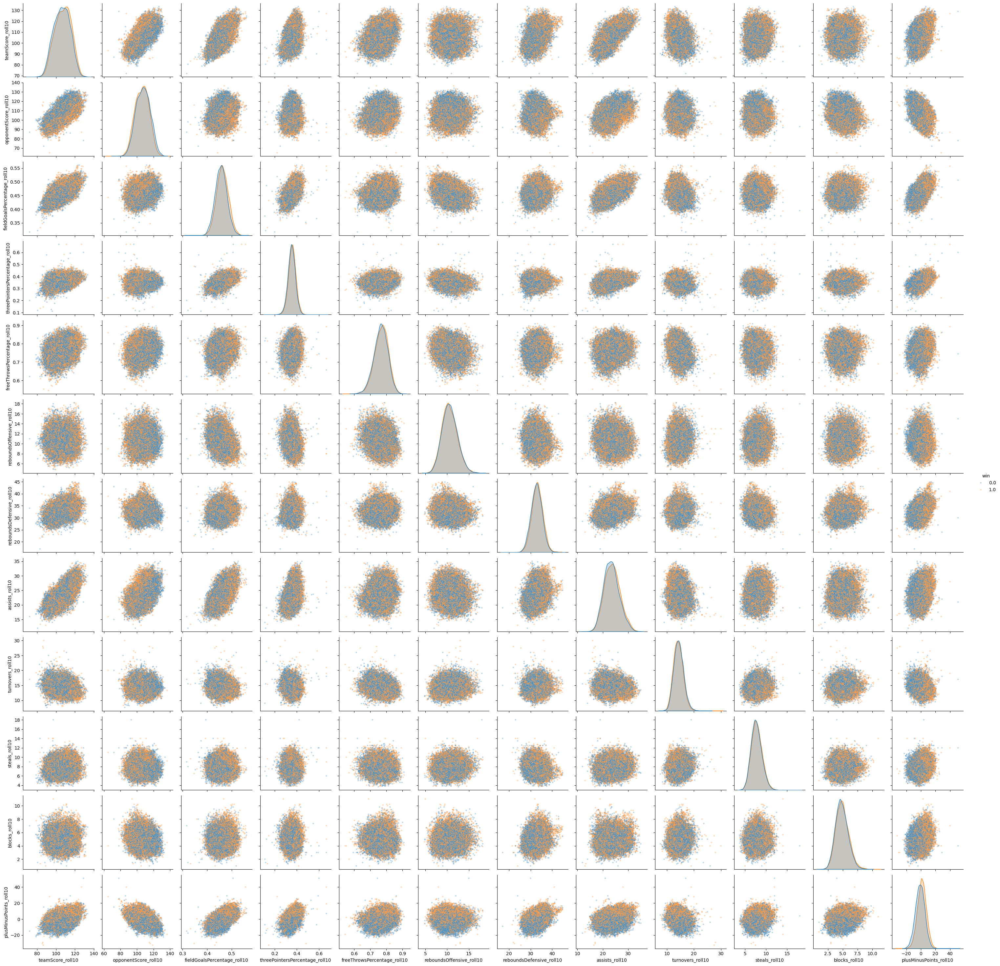

In [201]:
# plot of the rolling features: does not make a lot of sense, just to have a sense of the data
roll_feature_cols = [f'{col}_roll{window}' for col in roll_cols if col != 'win']

sns.pairplot(
    team_stats_recent_trim.dropna(subset=roll_feature_cols),
    vars=roll_feature_cols,
    hue='win',
    plot_kws={'alpha': 0.3, 's': 10}
)

In [202]:
team_stats_recent_trim.columns

Index(['gameId', 'gameDate', 'season', 'teamId', 'teamName', 'opponentTeamId',
       'opponentTeamName', 'home', 'win', 'teamScore', 'opponentScore',
       'fieldGoalsPercentage', 'threePointersPercentage',
       'freeThrowsPercentage', 'reboundsOffensive', 'reboundsDefensive',
       'assists', 'turnovers', 'steals', 'blocks', 'plusMinusPoints',
       'seasonWins', 'seasonLosses', 'teamScore_roll10',
       'opponentScore_roll10', 'fieldGoalsPercentage_roll10',
       'threePointersPercentage_roll10', 'freeThrowsPercentage_roll10',
       'reboundsOffensive_roll10', 'reboundsDefensive_roll10',
       'assists_roll10', 'turnovers_roll10', 'steals_roll10', 'blocks_roll10',
       'plusMinusPoints_roll10', 'win_roll10'],
      dtype='str')

In [203]:
matchup_recent = team_stats_recent_trim.merge(
    team_stats_recent_trim,
    on='gameId',
    suffixes=('_home', '_away')
)

# Keep only the home team's perspective (home == 1) to avoid mirrored duplicates
matchup_recent = matchup_recent[matchup_recent['home_home'] == 1]
matchup_recent = matchup_recent[matchup_recent['teamId_home'] != matchup_recent['teamId_away']]

In [204]:
matchup_recent

,gameId,gameDate_home,season_home,teamId_home,teamName_home,opponentTeamId_home,opponentTeamName_home,home_home,win_home,teamScore_home,...,threePointersPercentage_roll10_away,freeThrowsPercentage_roll10_away,reboundsOffensive_roll10_away,reboundsDefensive_roll10_away,assists_roll10_away,turnovers_roll10_away,steals_roll10_away,blocks_roll10_away,plusMinusPoints_roll10_away,win_roll10_away
1,11000017,2010-10-07 19:00:00,2010,1610612737,Hawks,1610612763,Grizzlies,1,0.0,111,...,0.29400,0.552000,13.0,36.00,16.00,30.00,10.000,4.0,2.0,1.000
9,11000087,2010-10-18 19:00:00,2010,1610612737,Hawks,1610612753,Magic,1,0.0,73,...,0.40360,0.753200,7.4,37.20,21.20,17.20,7.600,7.2,24.2,1.000
11,11000110,2010-10-21 20:00:00,2010,1610612737,Hawks,1610612748,Heat,1,1.0,98,...,0.34000,0.795200,10.8,30.00,18.80,18.60,6.000,5.0,-2.8,0.400
19,21000031,2010-10-30 19:00:00,2010,1610612737,Hawks,1610612764,Wizards,1,1.0,99,...,0.34125,0.668625,10.5,29.25,20.75,17.25,10.125,6.5,-3.0,0.375
23,21000054,2010-11-03 19:00:00,2010,1610612737,Hawks,1610612765,Pistons,1,1.0,94,...,0.36700,0.744800,9.6,29.20,19.40,15.80,6.300,4.2,-4.4,0.200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87024,22501085,2026-03-29 18:00:00,2025,1610612766,Hornets,1610612738,Celtics,1,0.0,99,...,0.34970,0.878000,11.9,35.80,24.10,12.40,6.100,2.8,5.2,0.700
87028,22501114,2026-04-02 19:00:00,2025,1610612766,Hornets,1610612756,Suns,1,1.0,127,...,0.36110,0.726900,12.9,29.70,26.50,11.30,8.900,4.7,3.6,0.300
87030,22501120,2026-04-03 19:00:00,2025,1610612766,Hornets,1610612754,Pacers,1,1.0,129,...,0.43010,0.814700,7.2,31.20,34.20,13.40,6.700,4.5,-3.9,0.300
87036,22501171,2026-04-10 19:00:00,2025,1610612766,Hornets,1610612765,Pistons,1,0.0,100,...,0.41820,0.779600,11.3,31.80,32.10,14.90,9.500,6.5,9.0,0.700


In [205]:
matchup_recent.columns

Index(['gameId', 'gameDate_home', 'season_home', 'teamId_home',
       'teamName_home', 'opponentTeamId_home', 'opponentTeamName_home',
       'home_home', 'win_home', 'teamScore_home', 'opponentScore_home',
       'fieldGoalsPercentage_home', 'threePointersPercentage_home',
       'freeThrowsPercentage_home', 'reboundsOffensive_home',
       'reboundsDefensive_home', 'assists_home', 'turnovers_home',
       'steals_home', 'blocks_home', 'plusMinusPoints_home', 'seasonWins_home',
       'seasonLosses_home', 'teamScore_roll10_home',
       'opponentScore_roll10_home', 'fieldGoalsPercentage_roll10_home',
       'threePointersPercentage_roll10_home',
       'freeThrowsPercentage_roll10_home', 'reboundsOffensive_roll10_home',
       'reboundsDefensive_roll10_home', 'assists_roll10_home',
       'turnovers_roll10_home', 'steals_roll10_home', 'blocks_roll10_home',
       'plusMinusPoints_roll10_home', 'win_roll10_home', 'gameDate_away',
       'season_away', 'teamId_away', 'teamName_away', '

In [206]:
roll_cols

['teamScore',
 'opponentScore',
 'fieldGoalsPercentage',
 'threePointersPercentage',
 'freeThrowsPercentage',
 'reboundsOffensive',
 'reboundsDefensive',
 'assists',
 'turnovers',
 'steals',
 'blocks',
 'plusMinusPoints',
 'win']

In [207]:
# find the difference of rolling average between home teams and visiting teams, which are more revelant to win/loss 
diff_cols = []
for col in roll_cols: 
    diff_name = f'{col}_roll{window}_diff'
    matchup_recent[diff_name] = matchup_recent[f'{col}_roll{window}_home'] - matchup_recent[f'{col}_roll{window}_away']
    diff_cols.append(diff_name)

In [208]:
diff_cols

['teamScore_roll10_diff',
 'opponentScore_roll10_diff',
 'fieldGoalsPercentage_roll10_diff',
 'threePointersPercentage_roll10_diff',
 'freeThrowsPercentage_roll10_diff',
 'reboundsOffensive_roll10_diff',
 'reboundsDefensive_roll10_diff',
 'assists_roll10_diff',
 'turnovers_roll10_diff',
 'steals_roll10_diff',
 'blocks_roll10_diff',
 'plusMinusPoints_roll10_diff',
 'win_roll10_diff']

In [209]:
matchup_recent.columns

Index(['gameId', 'gameDate_home', 'season_home', 'teamId_home',
       'teamName_home', 'opponentTeamId_home', 'opponentTeamName_home',
       'home_home', 'win_home', 'teamScore_home', 'opponentScore_home',
       'fieldGoalsPercentage_home', 'threePointersPercentage_home',
       'freeThrowsPercentage_home', 'reboundsOffensive_home',
       'reboundsDefensive_home', 'assists_home', 'turnovers_home',
       'steals_home', 'blocks_home', 'plusMinusPoints_home', 'seasonWins_home',
       'seasonLosses_home', 'teamScore_roll10_home',
       'opponentScore_roll10_home', 'fieldGoalsPercentage_roll10_home',
       'threePointersPercentage_roll10_home',
       'freeThrowsPercentage_roll10_home', 'reboundsOffensive_roll10_home',
       'reboundsDefensive_roll10_home', 'assists_roll10_home',
       'turnovers_roll10_home', 'steals_roll10_home', 'blocks_roll10_home',
       'plusMinusPoints_roll10_home', 'win_roll10_home', 'gameDate_away',
       'season_away', 'teamId_away', 'teamName_away', '

In [210]:
matchup_recent[['teamScore_roll10_diff', 'opponentScore_roll10_diff', 'plusMinusPoints_roll10_diff', 'win_roll10_diff']].head(10)

,teamScore_roll10_diff,opponentScore_roll10_diff,plusMinusPoints_roll10_diff,win_roll10_diff
1,NaN,NaN,NaN,NaN
9,-10.200000,18.500000,-28.700000,-0.750000
11,-1.600000,5.000000,-6.600000,-0.200000
19,-1.305556,1.583333,-2.888889,0.069444
23,-3.200000,-4.300000,1.100000,0.400000
27,-8.600000,-16.900000,8.300000,0.500000
31,6.700000,4.200000,2.500000,0.400000
33,-0.900000,2.200000,-3.100000,-0.100000
35,2.400000,-10.700000,13.100000,0.300000
39,4.400000,4.900000,-0.500000,0.000000


In [211]:
y = matchup_recent['win_home']  # 1 if home team won

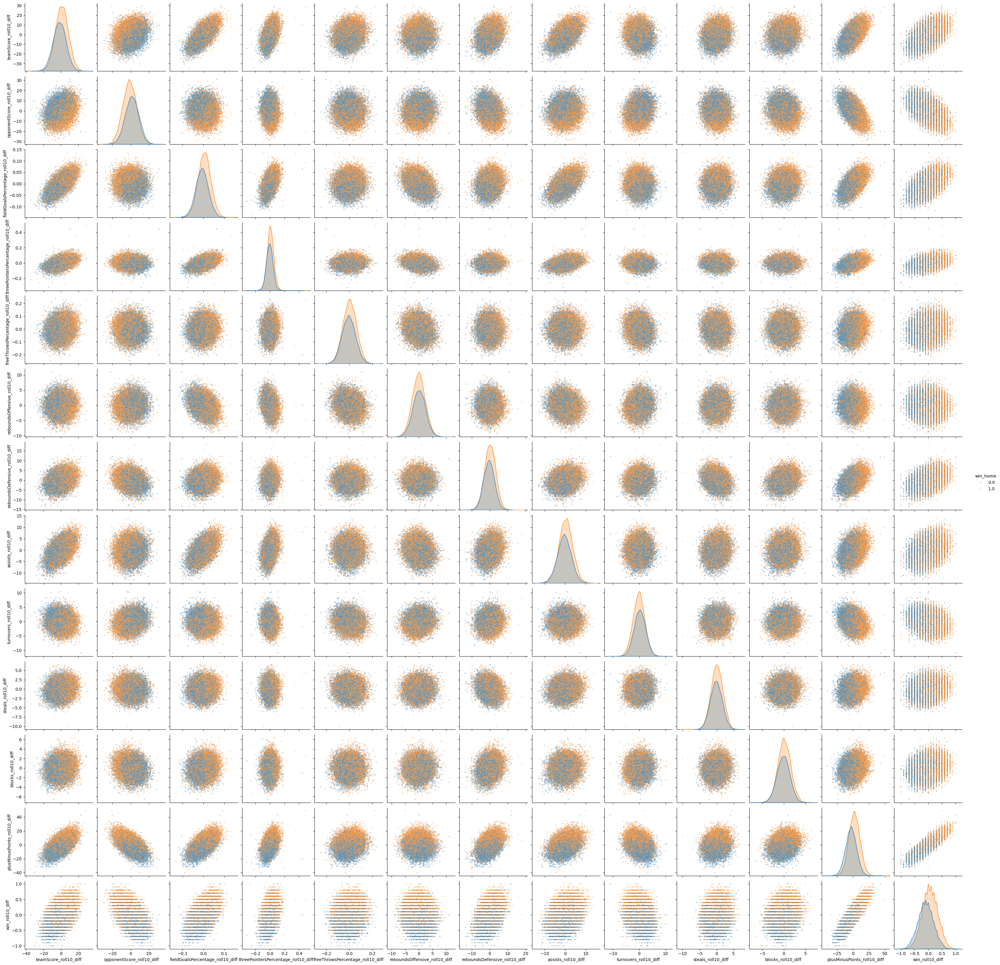

In [212]:
# drop off the early season games from 2010 when the rolling is not available
# prediction is available when the data is available for both teams 
matchup_clean = matchup_recent.dropna(subset=diff_cols)

sns.pairplot(
    matchup_clean,
    vars=diff_cols,
    hue='win_home',
    plot_kws={'alpha': 0.3, 's': 10}
)